In [1]:
## ЭТОТ БЛОК НЕ ТРОГАТЬ

from utilsOCR.utilsOCR import *

from ultralytics import YOLO
from transformers import AutoTokenizer, VisionEncoderDecoderModel
from transformers import TrOCRProcessor

class OCR:
    def __init__(
            self,
            detector_dir: str = 'detector/best.pt',
            recognizer_dir: str = 'Stealer0/trocr-base-ru_docs',
            processor_dir: str = 'Stealer0/trocr-base-ru_docs',
            device: str = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    ):
        self.device = device
        self.detector = YOLO(detector_dir)
        self.recognizer = VisionEncoderDecoderModel.from_pretrained(recognizer_dir)
        self.recognizer = self.recognizer.to(device)
        self.processor = TrOCRProcessor.from_pretrained(processor_dir, device=device)

    def detect(
            self, 
            image: PIL.Image.Image,
            boxes_format: str = 'pil'
        ):
        image = image.convert('RGB')
        bboxes = self.detector.predict(image)[0].boxes.to('cpu')

        if boxes_format == 'pil':
            h, w = bboxes.orig_shape
            boxes = []
            for box in bboxes:
                box = yolo2len(box.xywhn.numpy()[0], w, h)
                boxes.append(box)
        elif boxes_format in ['xywh', 'xywhn', 'xyxy', 'xyxyn']:
            boxes = []
            for box in bboxes:
                box = getattr(box, boxes_format).numpy()[0]
                boxes.append(box)
        else:
            raise Exception(f'\"boxes_format\" can be only xywh, xywhn, xyxy, xyxyn, pil but got {boxes_format}')
        return boxes
    
    def recognize(
            self,
            image: PIL.Image.Image,
            batch_size: int = 1, # При бОльших значениях может работать медленее
            return_croped_boxes: bool = False
        ):
        image = image.convert('RGB')
        image = np.array(image)
        image = preprocess(image)
        image = Image.fromarray(image)
        image = image.convert('RGB')
        
        boxes = self.detect(image)
        img_boxes = [image.crop(box) for box in boxes]

        pixel_values = self.processor(img_boxes, return_tensors="pt").pixel_values

        words = []
        dataloader = DataLoader(pixel_values, batch_size=batch_size, shuffle=False)
        for batch in dataloader:
            generated_ids = self.recognizer.generate(batch.to(self.device))
            words += self.processor.batch_decode(generated_ids, skip_special_tokens=True)

        if return_croped_boxes:
            return boxes, words, image, img_boxes
        else: 
            return boxes, words, image


In [4]:
aug = transforms.Compose([
    app_aug(iaa.SaltAndPepper(0.03)),
    app_aug(iaa.BlendAlphaVerticalLinearGradient(
        iaa.TotalDropout(1.0),
        min_value=0.0,
        max_value=0.4)),
    app_aug(iaa.Rotate((-10, 10), fit_output=True))
])

# Загружаем изображения и зашумляем их
images = [Image.open(f'example/img{i}.jpg') for i in [1,2,3]]
noised = [Image.fromarray(aug(np.array(img))) for img in images]

ocr = OCR()

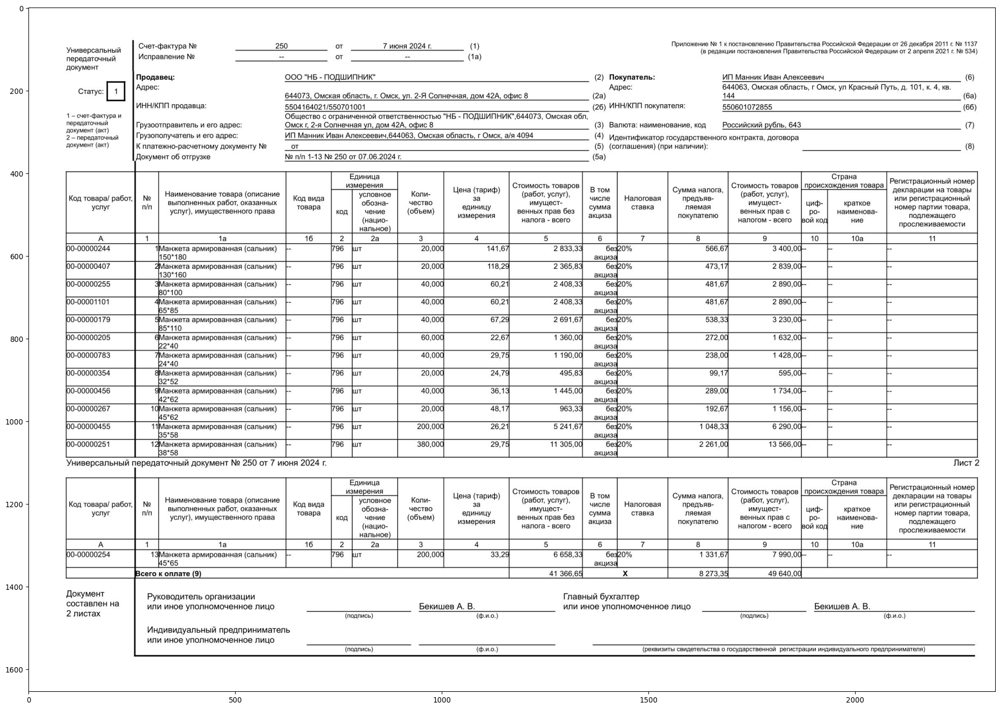

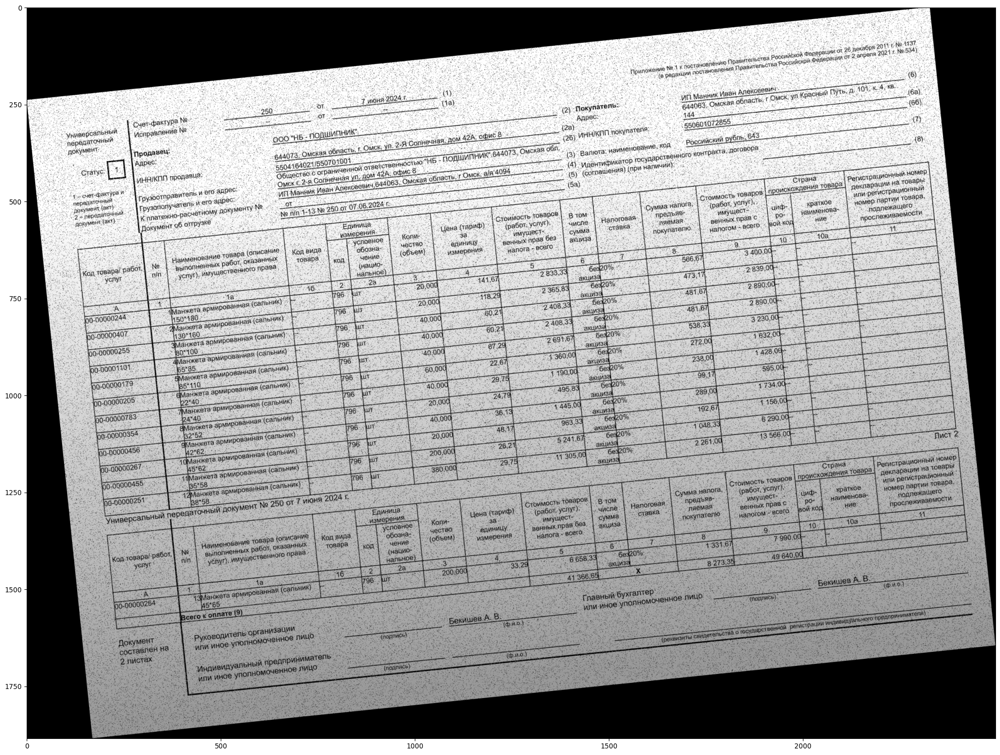

In [3]:
ia.imshow(np.array(images[2]))
ia.imshow(np.array(noised[2]))


In [5]:
# Метод recognize удаляет шум и поворачивает, после выделяет боксы и распознает текст на них
# И возвращает 4 списка:
#           координаты боксов в формате pil, слова в боксах, саму предобработанную картинку и картинки боксов
ocr = OCR()

boxes, words, img, imgs = [], [], [], []
for i in tqdm(range(3)):
    a, b, c, d = ocr.recognize(noised[i], return_croped_boxes=True)
    boxes.append(a)
    words.append(b)
    img.append(c)
    imgs.append(d)




  0%|          | 0/3 [00:00<?, ?it/s]


0: 1312x928 180 texts, 24.7ms
Speed: 3.9ms preprocess, 24.7ms inference, 0.6ms postprocess per image at shape (1, 3, 1312, 928)


 33%|███▎      | 1/3 [00:28<00:57, 28.54s/it]


0: 960x1312 300 texts, 22.9ms
Speed: 3.7ms preprocess, 22.9ms inference, 0.8ms postprocess per image at shape (1, 3, 960, 1312)


 67%|██████▋   | 2/3 [01:24<00:44, 44.81s/it]


0: 928x1312 300 texts, 23.3ms
Speed: 4.0ms preprocess, 23.3ms inference, 0.9ms postprocess per image at shape (1, 3, 928, 1312)


100%|██████████| 3/3 [02:22<00:00, 47.54s/it]


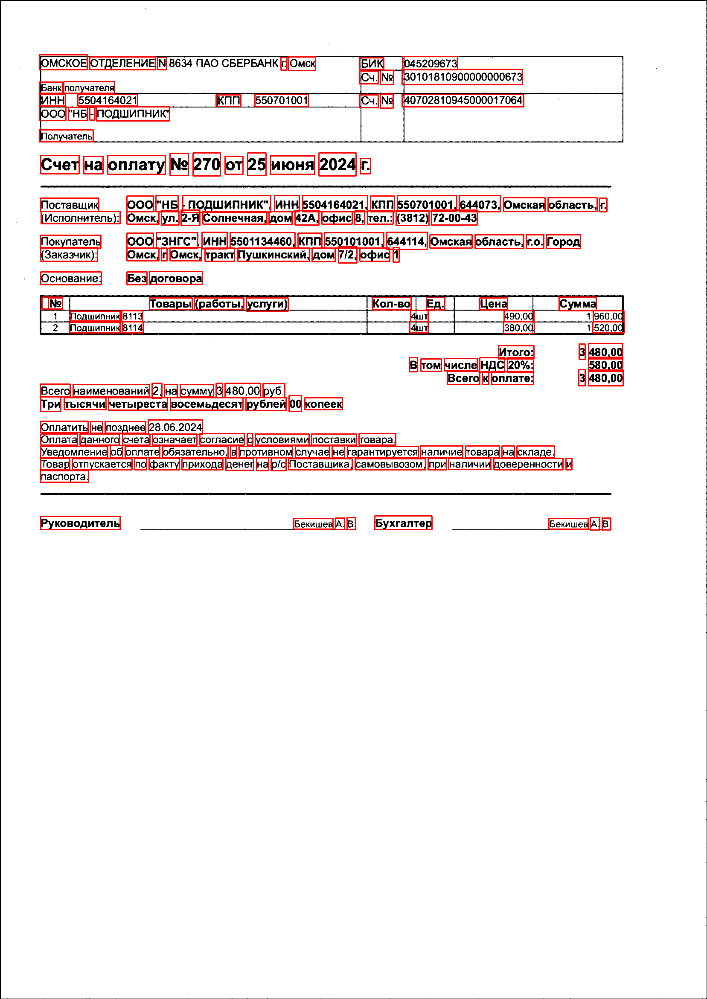

In [6]:
# 3 следующих слайда показывают как детектор выделил боксы
im_show = draw_ocr(img[0], list(map(len2crd, boxes[0])))
im_show = Image.fromarray(im_show)
im_show.show()

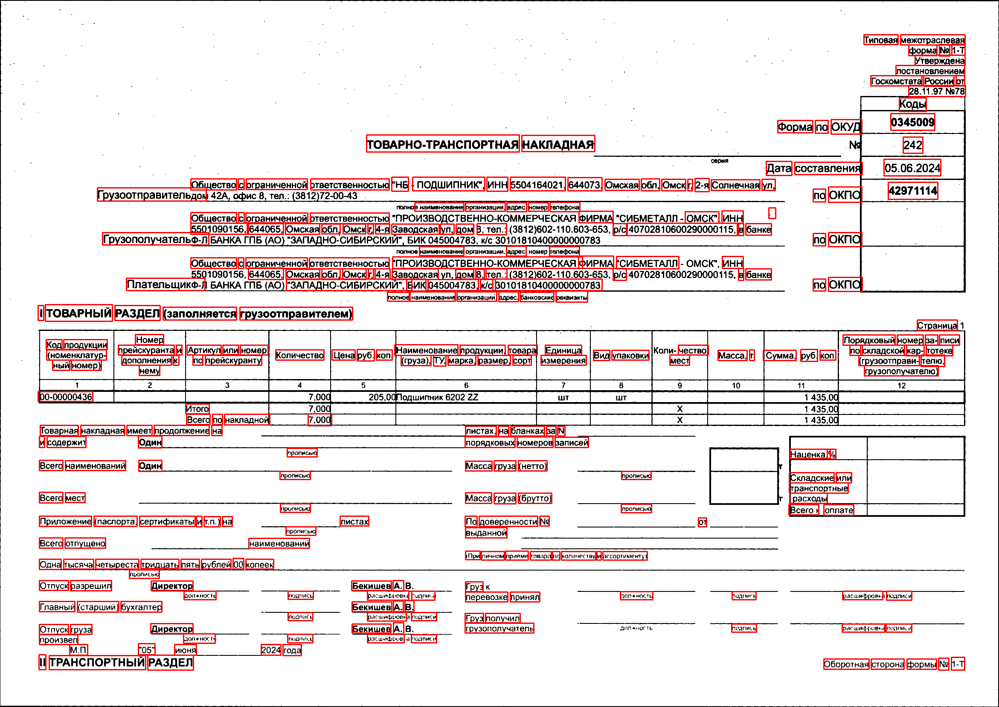

In [7]:
im_show = draw_ocr(img[1], list(map(len2crd, boxes[1])))
im_show = Image.fromarray(im_show)
im_show.show()

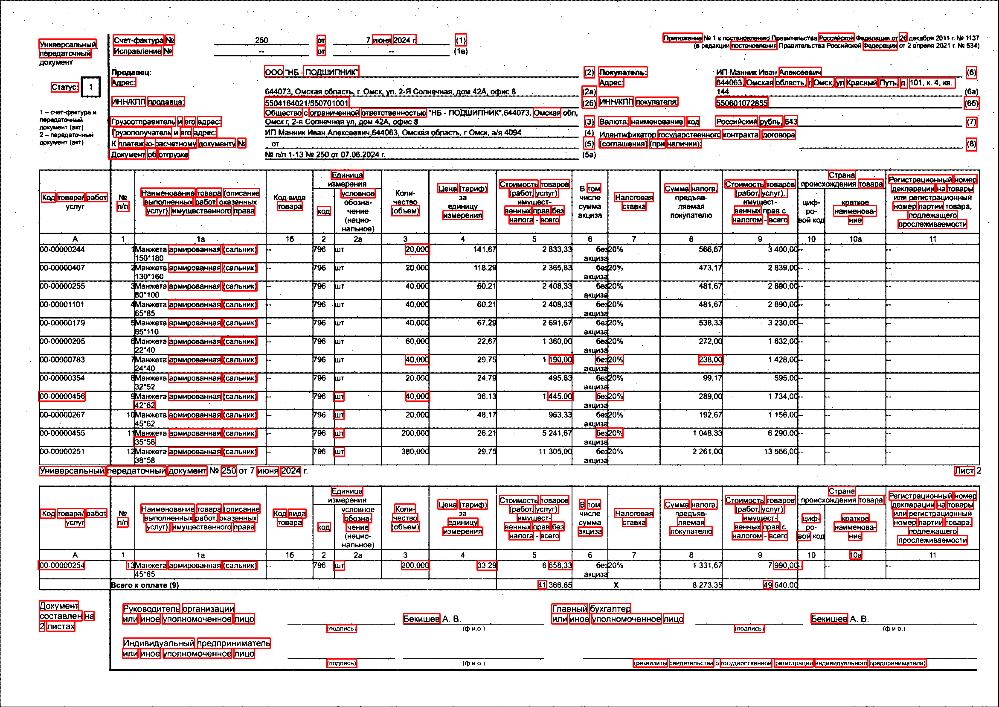

In [8]:
im_show = draw_ocr(img[2], list(map(len2crd, boxes[2])))
im_show = Image.fromarray(im_show)
im_show.show()

поставки


Омская


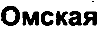

согласие


условиями


наименований


Оплатить


Омская


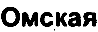

договора


область,


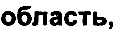

наличие


In [10]:
# 3 следующих блока показывют как распознаватель распознвала слова
num = 10
k = 0
for i in range(len(words[k]))[:num]:
    print(words[k][i])
    imgs[k][i].show()


In [11]:
num = 10
k = 1
for i in range(len(words[k]))[:num]:
    print(words[k][i])
    imgs[k][i].show()


продукции,


наименований


разрешил


товара


продукции


Типовая


Единица


сторона


(паспорта,


Товарная


In [12]:
num = 10
k = 2
for i in range(len(words[k]))[:num]:
    print(words[k][i])
    imgs[k][i].show()

Главный


товара


Покупатель:


бухгалтер


организации


наименование,


Российски�й


(тариф)


(тариф)


адрес:


In [ ]:
# Попробовать свою картинку

file_path = 'Вставьте сюда путь к картинке(желательно документ)'
image = Image.open(file_path)

ocr = OCR()
boxes, words, img, imgs = ocr.recognize(image, return_croped_boxes=True)

im_show = draw_ocr(img, list(map(len2crd, boxes)))
im_show = Image.fromarray(im_show)
im_show.show()

num = 10
for i in range(len(words))[:num]:
    print(words[i])
    imgs[i].show()